In [3]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline


In [4]:
full = cv2.imread('DATA/sammy.jpg')
full = cv2.cvtColor(full, cv2.COLOR_BGR2RGB)

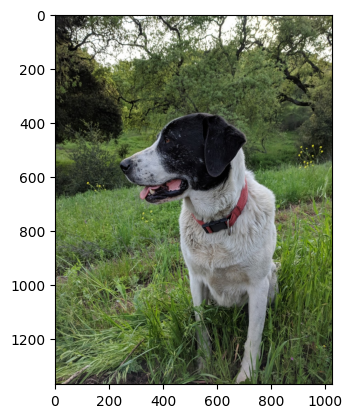

In [5]:
plt.imshow(full)

In [6]:
face= cv2.imread('DATA/sammy_face.jpg')
face = cv2.cvtColor(face, cv2.COLOR_BGR2RGB)

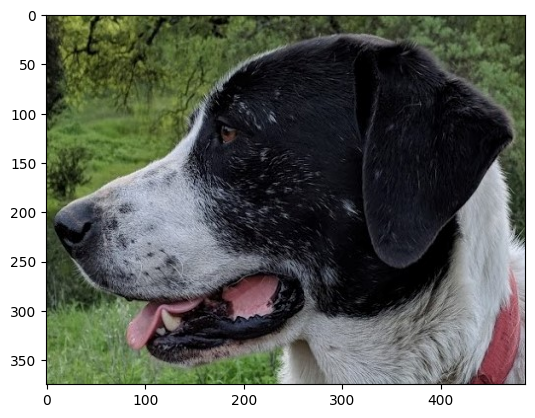

In [7]:
plt.imshow(face)

In [8]:
face.shape

(375, 486, 3)

In [9]:
height, width,channels = face.shape

In [10]:
#  All the 6 methods for comparison in a list
# Note how we are using strings, later on we'll use the eval() function to convert to function
methods = ['cv2.TM_CCOEFF', 'cv2.TM_CCOEFF_NORMED', 'cv2.TM_CCORR','cv2.TM_CCORR_NORMED', 'cv2.TM_SQDIFF', 'cv2.TM_SQDIFF_NORMED']

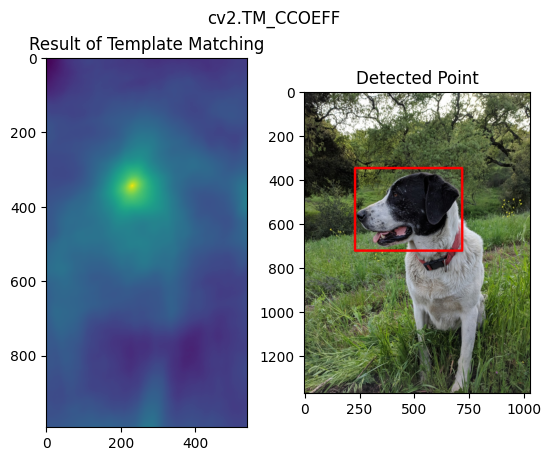

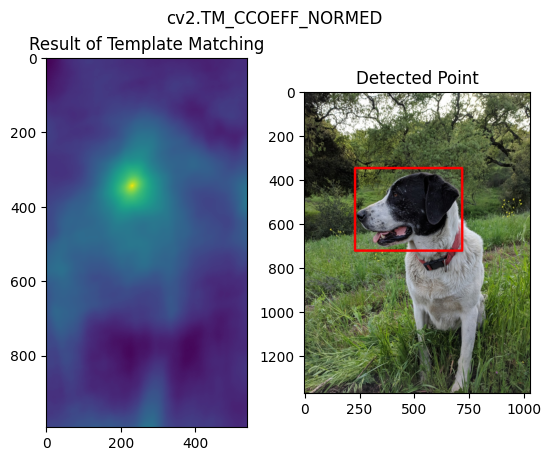

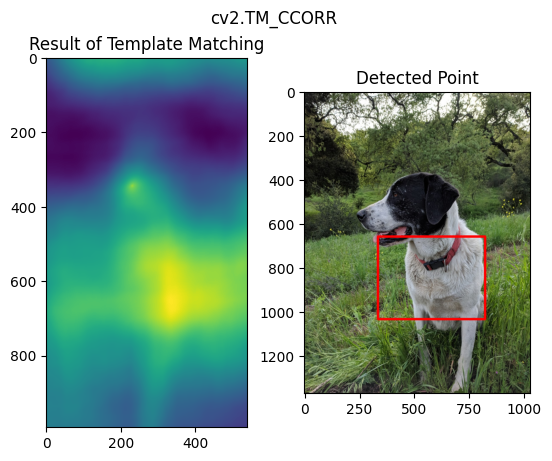

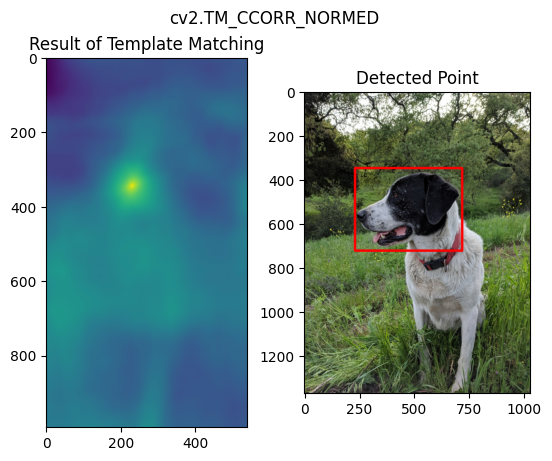

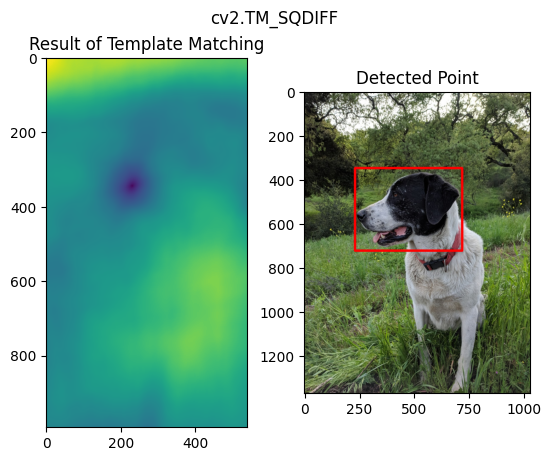

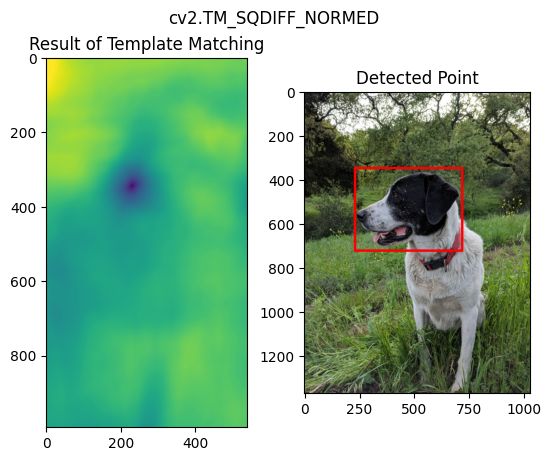

In [11]:
for m in methods:
    
    # Create a copy of the image
    full_copy = full.copy()
    
    # Get the actual function instead of the string
    method = eval(m)

    # Apply template Matching with the method
    res = cv2.matchTemplate(full_copy,face,method)
    
    # Grab the Max and Min values, plus their locations
    min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(res)
    
    # Set up drawing of Rectangle
    
    # If the method is TM_SQDIFF or TM_SQDIFF_NORMED, take minimum
    # Notice the coloring on the last 2 left hand side images.
    if method in [cv2.TM_SQDIFF, cv2.TM_SQDIFF_NORMED]:
        top_left = min_loc    
    else:
        top_left = max_loc
        
    # Assign the Bottom Right of the rectangle
    bottom_right = (top_left[0] + width, top_left[1] + height)

    # Draw the Red Rectangle
    cv2.rectangle(full_copy,top_left, bottom_right, 255, 10)

    # Plot the Images
    plt.subplot(121)
    plt.imshow(res)
    plt.title('Result of Template Matching')
    
    plt.subplot(122)
    plt.imshow(full_copy)
    plt.title('Detected Point')
    plt.suptitle(m)
    
    
    plt.show()
    print('\n')
    print('\n')
    

In [12]:
my_method=eval('cv2.TM_CCOEFF')
res=cv2.matchTemplate(full,face,my_method)

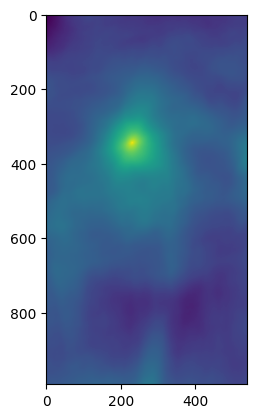

In [13]:
plt.imshow(res)

## Corner detection

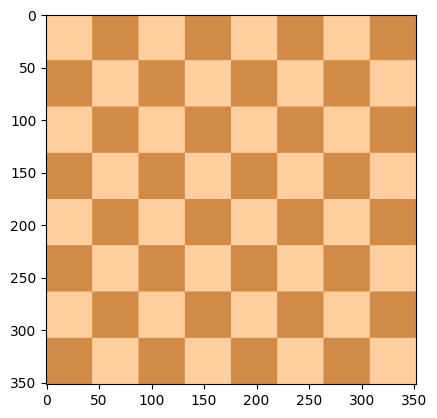

In [14]:
flat_chess = cv2.imread('DATA/flat_chessboard.png')
flat_chess = cv2.cvtColor(flat_chess,cv2.COLOR_BGR2RGB)
plt.imshow(flat_chess)

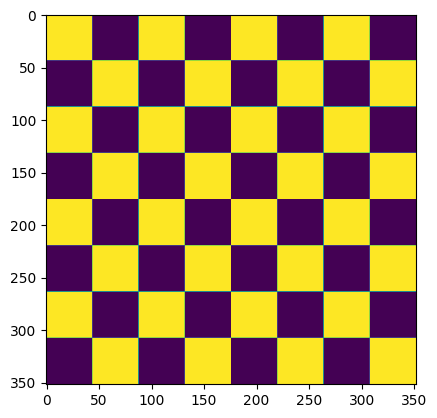

In [15]:
gray_flat_chess = cv2.cvtColor(flat_chess,cv2.COLOR_BGR2GRAY)
plt.imshow(gray_flat_chess)

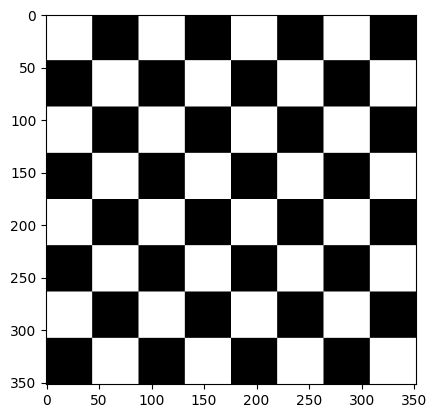

In [16]:
gray_flat_chess = cv2.cvtColor(flat_chess,cv2.COLOR_BGR2GRAY)
plt.imshow(gray_flat_chess,cmap='gray')

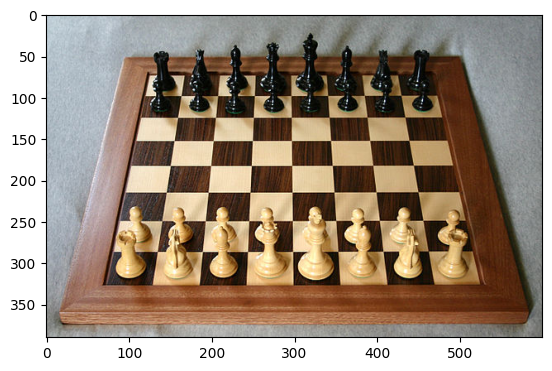

In [17]:
real_chess = cv2.imread('DATA/real_chessboard.jpg')
real_chess = cv2.cvtColor(real_chess,cv2.COLOR_BGR2RGB)
plt.imshow(real_chess)

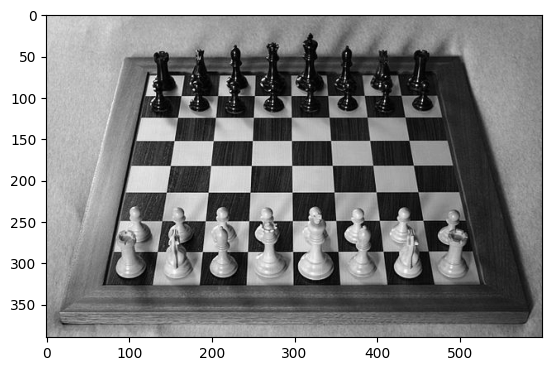

In [18]:
gray_real_chess = cv2.cvtColor(real_chess,cv2.COLOR_BGR2GRAY)
plt.imshow(gray_real_chess,cmap='gray')

In [19]:
gray=np.float32(gray_flat_chess)
gray

array([[197., 197., 197., ..., 127., 127., 127.],
       [197., 197., 197., ..., 127., 127., 127.],
       [197., 197., 197., ..., 127., 127., 127.],
       ...,
       [127., 127., 127., ..., 197., 197., 197.],
       [127., 127., 127., ..., 197., 197., 197.],
       [127., 127., 127., ..., 197., 197., 197.]], dtype=float32)

## Haris Corner Detection

**cornerHarris Function**

*  src Input single-channel 8-bit or floating-point image.
*  dst Image to store the Harris detector responses. It has the type CV_32FC1 and the same size as src .
*  blockSize Neighborhood size (see the details on #cornerEigenValsAndVecs ).
*  ksize Aperture parameter for the Sobel operator.
*  k Harris detector free parameter. See the formula in DocString
*  borderType Pixel extrapolation method. See #BorderTypes.

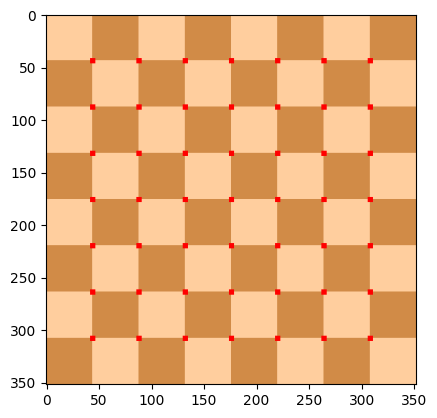

In [20]:
# Convert Gray Scale Image to Float Values
gray = np.float32(gray_flat_chess)

# Corner Harris Detection
dst = cv2.cornerHarris(src=gray,blockSize=2,ksize=3,k=0.04)

# result is dilated for marking the corners, not important to actual corner detection
# this is just so we can plot out the points on the image shown
dst = cv2.dilate(dst,None)

# Threshold for an optimal value, it may vary depending on the image.
flat_chess[dst>0.01*dst.max()]=[255,0,0]

plt.imshow(flat_chess)

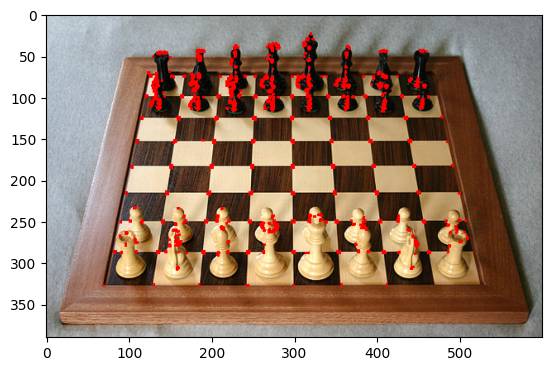

In [21]:
# Convert Gray Scale Image to Float Values
gray = np.float32(gray_real_chess)

# Corner Harris Detection
dst = cv2.cornerHarris(src=gray,blockSize=2,ksize=3,k=0.04)

# result is dilated for marking the corners, not important to actual corner detection
# this is just so we can plot out the points on the image shown
dst = cv2.dilate(dst,None)

# Threshold for an optimal value, it may vary depending on the image.
real_chess[dst>0.01*dst.max()]=[255,0,0]

plt.imshow(real_chess)

-----

## Shi-Tomasi Corner Detector & Good Features to Track Paper

[Link to Paper from Video](http://www.ai.mit.edu/courses/6.891/handouts/shi94good.pdf)

goodFeatureToTrack Function Parameters

* image Input 8-bit or floating-point 32-bit, single-channel image.
* corners Output vector of detected corners.
* maxCorners Maximum number of corners to return. If there are more corners than are found,the strongest of them is returned. `maxCorners <= 0` implies that no limit on the maximum is set and all detected corners are returned.
* qualityLevel Parameter characterizing the minimal accepted quality of image corners. The parameter value is multiplied by the best corner quality measure, which is the minimal eigenvalue (see #cornerMinEigenVal ) or the Harris function response (see #cornerHarris ). The corners with the quality measure less than the product are rejected. For example, if the best corner has the quality measure = 1500, and the qualityLevel=0.01 , then all the corners with the quality measure less than 15 are rejected.

In [22]:
# Need to reset the images since we drew on them
flat_chess = cv2.imread('DATA/flat_chessboard.png')
flat_chess = cv2.cvtColor(flat_chess,cv2.COLOR_BGR2RGB)
gray_flat_chess = cv2.cvtColor(flat_chess,cv2.COLOR_BGR2GRAY)

In [23]:
gray_flat_chess

array([[197, 197, 197, ..., 127, 127, 127],
       [197, 197, 197, ..., 127, 127, 127],
       [197, 197, 197, ..., 127, 127, 127],
       ...,
       [127, 127, 127, ..., 197, 197, 197],
       [127, 127, 127, ..., 197, 197, 197],
       [127, 127, 127, ..., 197, 197, 197]], dtype=uint8)

In [24]:
flat_chess

array([[[255, 206, 158],
        [255, 206, 158],
        [255, 206, 158],
        ...,
        [209, 139,  71],
        [209, 139,  71],
        [209, 139,  71]],

       [[255, 206, 158],
        [255, 206, 158],
        [255, 206, 158],
        ...,
        [209, 139,  71],
        [209, 139,  71],
        [209, 139,  71]],

       [[255, 206, 158],
        [255, 206, 158],
        [255, 206, 158],
        ...,
        [209, 139,  71],
        [209, 139,  71],
        [209, 139,  71]],

       ...,

       [[209, 139,  71],
        [209, 139,  71],
        [209, 139,  71],
        ...,
        [255, 206, 158],
        [255, 206, 158],
        [255, 206, 158]],

       [[209, 139,  71],
        [209, 139,  71],
        [209, 139,  71],
        ...,
        [255, 206, 158],
        [255, 206, 158],
        [255, 206, 158]],

       [[209, 139,  71],
        [209, 139,  71],
        [209, 139,  71],
        ...,
        [255, 206, 158],
        [255, 206, 158],
        [255, 206, 158]]

C:\Users\PC\AppData\Local\Temp\ipykernel_10412\39607654.py:3: DeprecationWarning: `np.int0` is a deprecated alias for `np.intp`.  (Deprecated NumPy 1.24)
  corners = np.int0(corners)


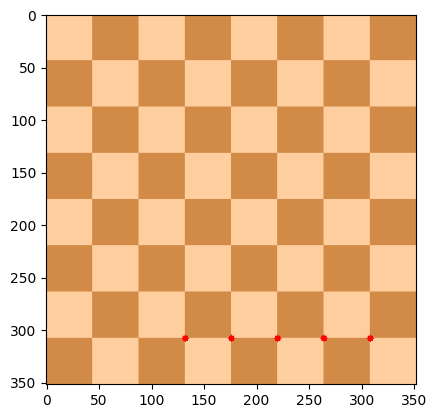

In [25]:
corners = cv2.goodFeaturesToTrack(gray_flat_chess,5,0.01,10)
#5 số lượng điểm muốn phát hiện
corners = np.int0(corners)

for i in corners:
    x,y = i.ravel()
    cv2.circle(flat_chess,(x,y),3,255,-1)

plt.imshow(flat_chess)

C:\Users\PC\AppData\Local\Temp\ipykernel_10412\1148112571.py:2: DeprecationWarning: `np.int0` is a deprecated alias for `np.intp`.  (Deprecated NumPy 1.24)
  corners = np.int0(corners)


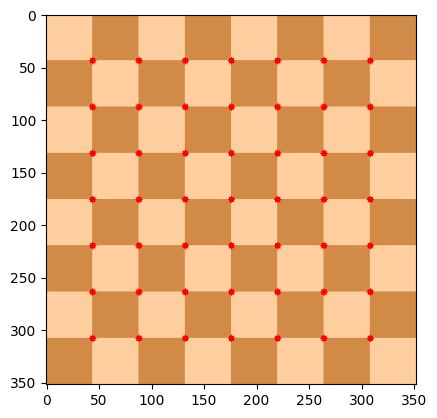

In [26]:
corners = cv2.goodFeaturesToTrack(gray_flat_chess,64,0.01,10)
corners = np.int0(corners)

for i in corners:
    x,y = i.ravel()
    cv2.circle(flat_chess,(x,y),3,255,-1)

plt.imshow(flat_chess)

In [27]:
real_chess = cv2.imread('DATA/real_chessboard.jpg')
real_chess = cv2.cvtColor(real_chess,cv2.COLOR_BGR2RGB)
gray_real_chess = cv2.cvtColor(real_chess,cv2.COLOR_BGR2GRAY)

C:\Users\PC\AppData\Local\Temp\ipykernel_10412\1649863848.py:2: DeprecationWarning: `np.int0` is a deprecated alias for `np.intp`.  (Deprecated NumPy 1.24)
  corners = np.int0(corners)


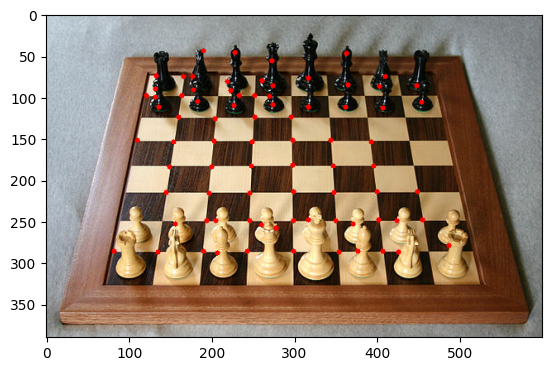

In [28]:
corners = cv2.goodFeaturesToTrack(gray_real_chess,80,0.01,10)
corners = np.int0(corners)

for i in corners:
    x,y = i.ravel()
    cv2.circle(real_chess,(x,y),3,255,-1)

plt.imshow(real_chess)

## Edge detection
* Edge detection là một quá trình trong xử lý ảnh dùng để xác định và nổi bật các biên giới (hoặc cạnh) giữa các vùng khác nhau trong một hình ảnh. Mục đích của edge detection là phát hiện và phân biệt sự thay đổi cường độ của pixel, từ đó giúp nhận biết sự chuyển động, đối tượng và các đặc trưng quan trọng trong hình ảnh.

Khi thực hiện edge detection, một số phương pháp và thuật toán thông dụng có thể được sử dụng, bao gồm:

* Sobel Operator: Sử dụng bộ lọc Sobel để tính toán đạo hàm cường độ của ảnh theo hai hướng: dọc và ngang. Sau đó, kết hợp hai hướng này để tạo ra biên giới.

* Canny Edge Detector: Là một phương pháp phổ biến, bao gồm nhiều bước như làm trơn ảnh, tìm độ lớn và hướng của gradient, và cuối cùng là phát hiện và điều chỉnh biên giới.

* Prewitt Operator: Giống như Sobel, nhưng sử dụng bộ lọc Prewitt để tìm gradient của ảnh.

* Laplacian Operator: Sử dụng bộ lọc Laplacian để xác định các sự thay đổi cường độ trong ảnh, từ đó tạo ra biên giới.

* Robert Operator: Một thuật toán đơn giản sử dụng bộ lọc Robert để phát hiện biên giới.

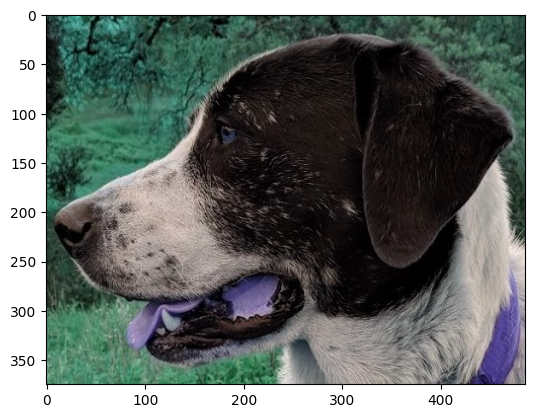

In [29]:
img = cv2.imread('DATA/sammy_face.jpg')
plt.imshow(img)

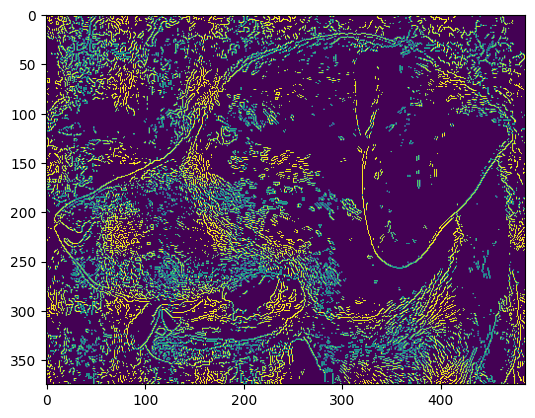

In [30]:
edges = cv2.Canny(image=img, threshold1=127, threshold2=127)
plt.imshow(edges)

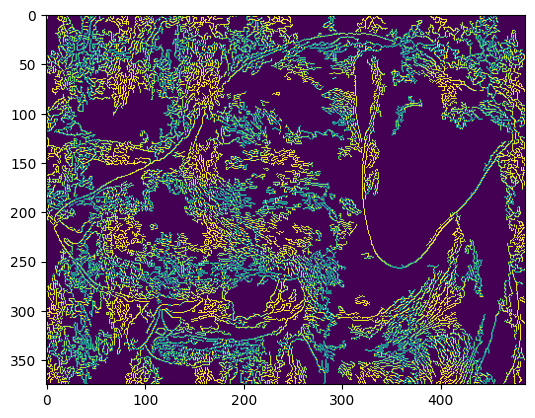

In [31]:
edges = cv2.Canny(image=img, threshold1=0, threshold2=255)
plt.imshow(edges)

In [32]:
# Calculate the median pixel value
med_val = np.median(img) 
med_val

64.0

In [33]:
# Lower bound is either 0 or 70% of the median value, whicever is higher
lower = int(max(0, 0.7* med_val))

# Upper bound is either 255 or 30% above the median value, whichever is lower
upper = int(min(255,1.3 * med_val))

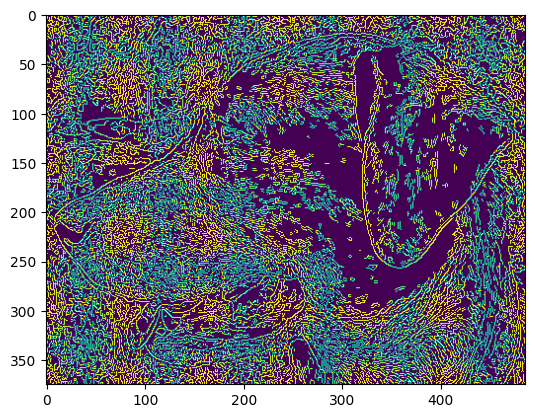

In [34]:
edges = cv2.Canny(image=img, threshold1=lower , threshold2=upper)
plt.imshow(edges)

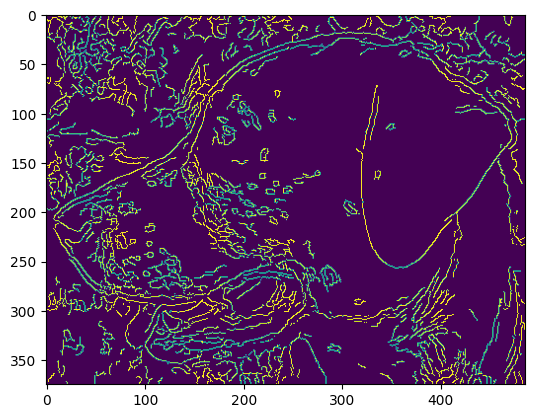

In [35]:
# Sometimes it helps to blur the images first, so we don't pick up minor edges
blurred_img = cv2.blur(img,ksize=(5,5))
edges = cv2.Canny(image=blurred_img, threshold1=lower , threshold2=upper)
plt.imshow(edges)

In [36]:
print(lower,upper)

44 83


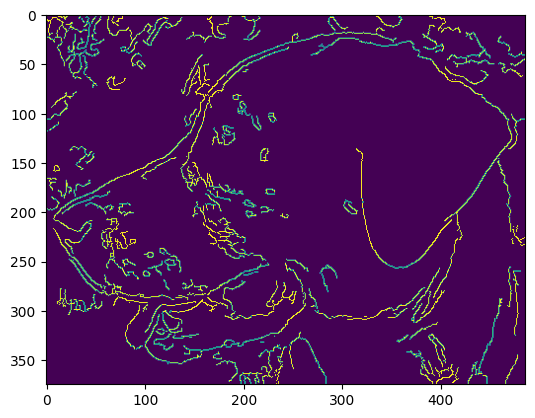

In [37]:
edges = cv2.Canny(image=blurred_img, threshold1=lower , threshold2=upper+50)
plt.imshow(edges)

## Grid detection

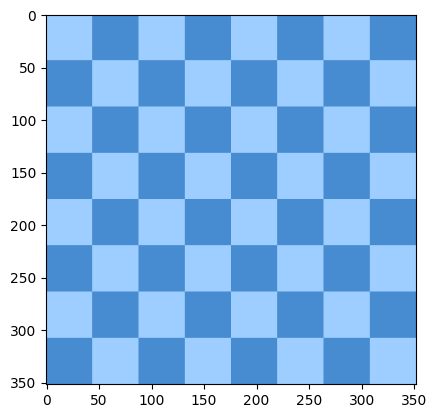

In [38]:
flat_chess = cv2.imread('DATA/flat_chessboard.png')
plt.imshow(flat_chess,cmap='gray')

In [39]:
# found: Bien dung sai, de check xem co grid trong anh ko, corner la mot mang chua cac toa do cac grid
found, corners = cv2.findChessboardCorners(flat_chess,(7,7))
if found:
    print('OpenCV was able to find the corners')
else:
    print("OpenCV did not find corners. Double check your patternSize.")

OpenCV was able to find the corners


In [40]:
flat_chess_copy = flat_chess.copy()
cv2.drawChessboardCorners(flat_chess_copy, (7, 7), corners, found)

array([[[158, 206, 255],
        [158, 206, 255],
        [158, 206, 255],
        ...,
        [ 71, 139, 209],
        [ 71, 139, 209],
        [ 71, 139, 209]],

       [[158, 206, 255],
        [158, 206, 255],
        [158, 206, 255],
        ...,
        [ 71, 139, 209],
        [ 71, 139, 209],
        [ 71, 139, 209]],

       [[158, 206, 255],
        [158, 206, 255],
        [158, 206, 255],
        ...,
        [ 71, 139, 209],
        [ 71, 139, 209],
        [ 71, 139, 209]],

       ...,

       [[ 71, 139, 209],
        [ 71, 139, 209],
        [ 71, 139, 209],
        ...,
        [158, 206, 255],
        [158, 206, 255],
        [158, 206, 255]],

       [[ 71, 139, 209],
        [ 71, 139, 209],
        [ 71, 139, 209],
        ...,
        [158, 206, 255],
        [158, 206, 255],
        [158, 206, 255]],

       [[ 71, 139, 209],
        [ 71, 139, 209],
        [ 71, 139, 209],
        ...,
        [158, 206, 255],
        [158, 206, 255],
        [158, 206, 255]]

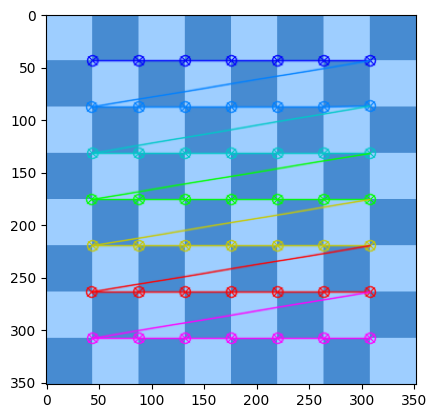

In [41]:
plt.imshow(flat_chess_copy)

## Circle Based Grids

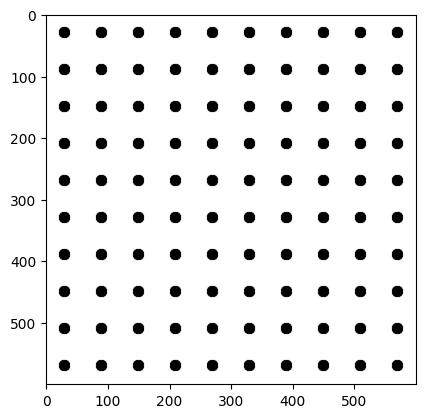

In [42]:
dots = cv2.imread('DATA/dot_grid.png')
plt.imshow(dots)

In [43]:
found, corners = cv2.findCirclesGrid(dots, (10,10), cv2.CALIB_CB_SYMMETRIC_GRID)

In [44]:
dbg_image_circles = dots.copy()
cv2.drawChessboardCorners(dbg_image_circles, (10, 10), corners, found)

array([[[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       ...,

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]]

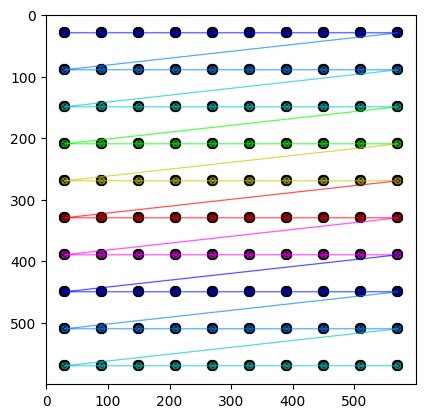

In [45]:
plt.imshow(dbg_image_circles)

## Feature Matching

Feature matching trong computer vision là quá trình tìm kiếm và so khớp các điểm đặc trưng (hoặc features) giữa hai hoặc nhiều hình ảnh. Điểm đặc trưng thường được sử dụng để biểu diễn các điểm độc đáo trên hình ảnh, chẳng hạn như góc, biên hoặc điểm quan trọng khác.

Mục tiêu của feature matching là tìm ra các điểm đặc trưng trên một hình ảnh gốc và tìm ra các điểm tương ứng trên một hình ảnh khác. Khi hai hình ảnh có các điểm đặc trưng tương tự, chúng ta có thể sử dụng các điểm đó để ước lượng sự chuyển động giữa hai hình ảnh, như trong các ứng dụng như ghép ảnh (image stitching), khớp hình ảnh (image registration), theo dõi điểm đối tượng (object tracking) và nhiều ứng dụng khác.

Các phương pháp phổ biến được sử dụng trong feature matching bao gồm:

* SIFT (Scale-Invariant Feature Transform): Phát hiện và mô tả các điểm đặc trưng dựa trên đặc điểm tỉ lệ của hình ảnh.

* SURF (Speeded-Up Robust Features): Một biến thể nhanh và hiệu quả của SIFT.

* ORB (Oriented FAST and Rotated BRIEF): Kết hợp giữa phát hiện điểm đặc trưng FAST và mô tả BRIEF.

* AKAZE: Dựa trên phát hiện đặc trưng không chỉ phụ thuộc vào tỉ lệ và độ xoay nhưng còn phụ thuộc vào cường độ và chiều sắc nét của hình ảnh.

* BRISK, FREAK, và các phương pháp khác: Các phương pháp khác nhằm tối ưu hóa hiệu suất và độ chính xác trong các tác vụ cụ thể.

In [46]:
def display(img,cmap='gray'):
    fig = plt.figure(figsize=(12,10))
    ax = fig.add_subplot(111)
    ax.imshow(img,cmap='gray')

In [47]:
reeses = cv2.imread('DATA/reeses_puffs.png',0)     
reeses

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=uint8)

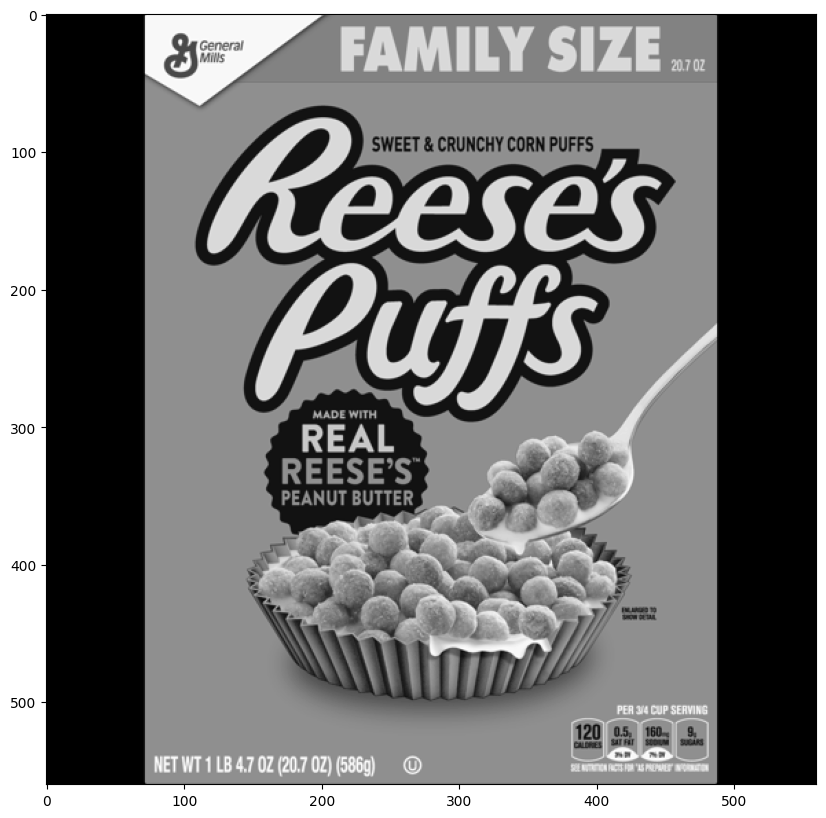

In [48]:
display(reeses)

In [49]:
cereals = cv2.imread('DATA/many_cereals.jpg',0) 

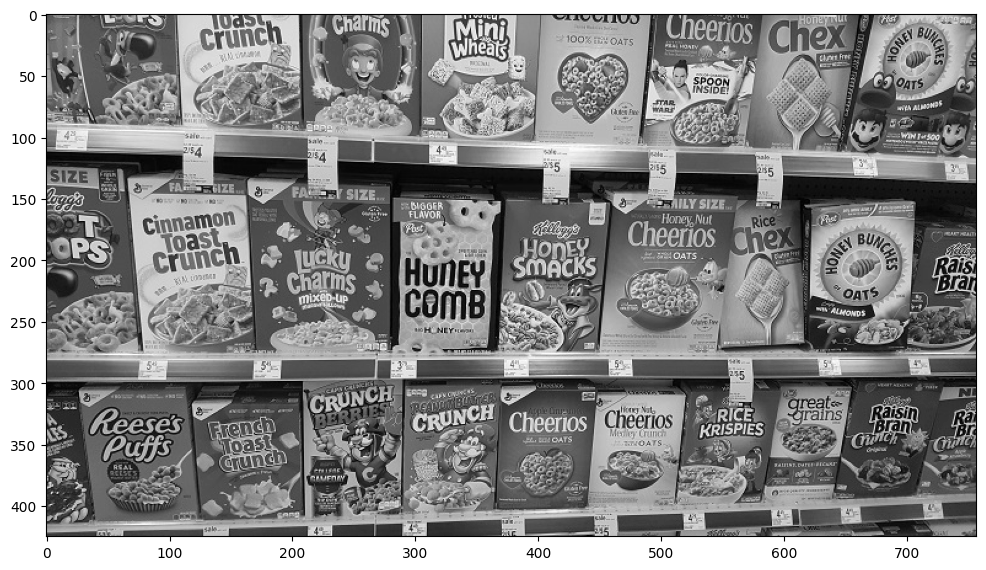

In [50]:
display(cereals)

--------
# Brute Force Detection with ORB Descriptors


Đoạn code trên mô tả một quy trình cơ bản để sử dụng ORB (Oriented FAST and Rotated BRIEF) và Brute Force Matcher trong OpenCV để so khớp và vẽ các điểm khớp giữa hai hình ảnh. 

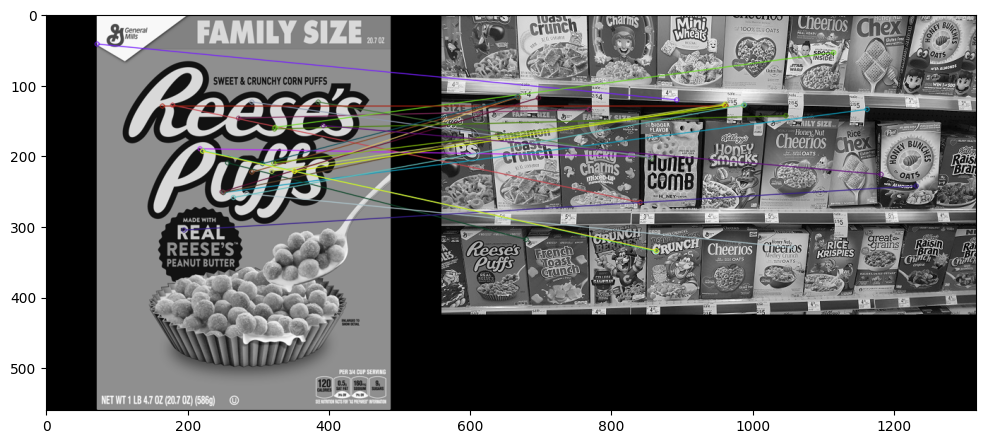

In [51]:
# Initiate ORB detector
orb = cv2.ORB_create()

# find the keypoints and descriptors with ORB
kp1, des1 = orb.detectAndCompute(reeses,None)
kp2, des2 = orb.detectAndCompute(cereals,None)

# create BFMatcher object
bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)

# Match descriptors.
matches = bf.match(des1,des2)

# Sort them in the order of their distance.
matches = sorted(matches, key = lambda x:x.distance)

# Draw first 25 matches.
reeses_matches = cv2.drawMatches(reeses,kp1,cereals,kp2,matches[:25],None,flags=2)
display(reeses_matches)

# Brute-Force Matching with SIFT Descriptors and Ratio Test

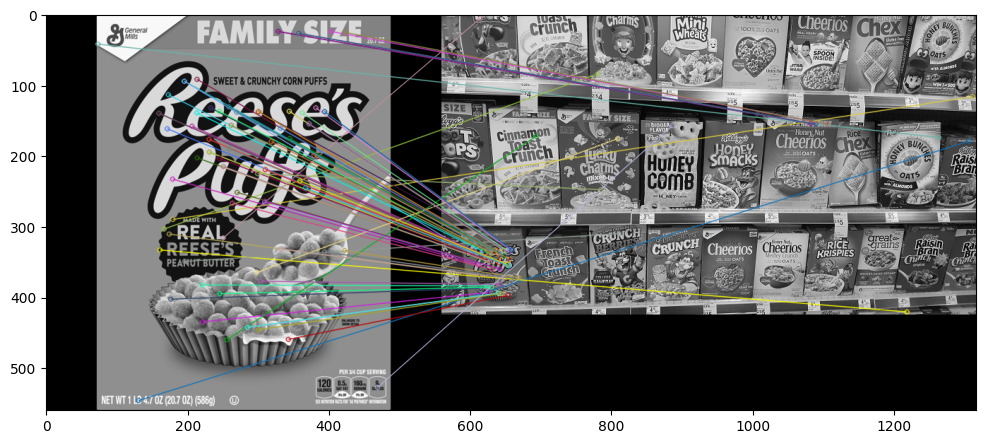

In [52]:
# Create SIFT Object
sift = cv2.SIFT_create()
# sift = cv2.xfeatures2d.SIFT_create() this version not support xfeature 2d attribute

# find the keypoints and descriptors with SIFT
kp1, des1 = sift.detectAndCompute(reeses,None)
kp2, des2 = sift.detectAndCompute(cereals,None)

# BFMatcher with default params
bf = cv2.BFMatcher()
matches = bf.knnMatch(des1,des2, k=2)

# Apply ratio test
good = []
for match1,match2 in matches:
    if match1.distance < 0.75*match2.distance:
        good.append([match1])

# cv2.drawMatchesKnn expects list of lists as matches.
sift_matches = cv2.drawMatchesKnn(reeses,kp1,cereals,kp2,good,None,flags=2)
display(sift_matches)

# FLANN based Matcher

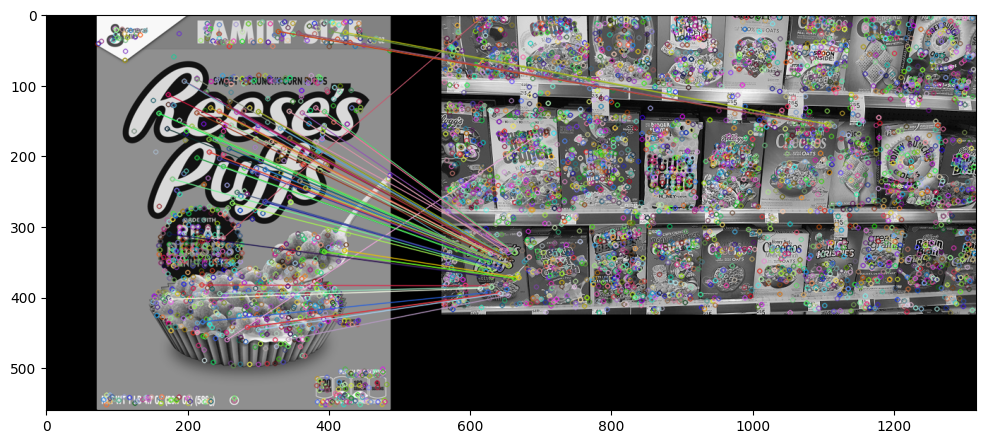

In [53]:
# Initiate SIFT detector
sift = cv2.SIFT_create()

# find the keypoints and descriptors with SIFT
kp1, des1 = sift.detectAndCompute(reeses,None)
kp2, des2 = sift.detectAndCompute(cereals,None)

# FLANN parameters
FLANN_INDEX_KDTREE = 0
index_params = dict(algorithm = FLANN_INDEX_KDTREE, trees = 5)
search_params = dict(checks=50)  

flann = cv2.FlannBasedMatcher(index_params,search_params)

matches = flann.knnMatch(des1,des2,k=2)

good = []

# ratio test
for i,(match1,match2) in enumerate(matches):
    if match1.distance < 0.7*match2.distance:
        
        good.append([match1])


flann_matches = cv2.drawMatchesKnn(reeses,kp1,cereals,kp2,good,None,flags=0)

display(flann_matches)


Cả ba phương pháp: Approximate Nearest Neighbors (ANN) với Fast Library for Approximate Nearest Neighbors (FLANN), Brute-Force Matching với SIFT Descriptors và Ratio Test, cũng như Brute-Force Matching với ORB Descriptors, đều là các phương pháp phổ biến trong feature matching. Dưới đây là sự phân biệt giữa chúng:

#### FLANN (Fast Library for Approximate Nearest Neighbors):
Phương pháp: Sử dụng thuật toán tìm kiếm gần nhất xấp xỉ để tìm các điểm khớp.

* Ưu điểm:
Tính Nhanh: Thường nhanh hơn so với Brute-Force với số lượng keypoints lớn.
Tối ưu: Được thiết kế để hoạt động tốt với các bộ dữ liệu lớn và không gian đặc trưng cao chiều.
* Nhược điểm:
Kết quả Xấp Xỉ: Do tìm kiếm gần nhất xấp xỉ, kết quả có thể không chính xác như Brute-Force.

#### Brute-Force Matching với SIFT Descriptors và Ratio Test:
Phương pháp: So khớp tất cả các descriptors của một hình ảnh với tất cả các descriptors của hình ảnh khác và áp dụng kiểm tra tỉ lệ để loại bỏ các matches không chính xác.

* Ưu điểm:
Chính Xác: Kiểm tra tỉ lệ giúp loại bỏ nhiều matches không chính xác.
Độ Chính Xác Cao: SIFT descriptors thường cung cấp các đặc trưng mạnh mẽ và chính xác.
* Nhược điểm:
Tính Toán Tốn Kém: Brute-Force matching có thể tốn nhiều thời gian và tài nguyên tính toán, đặc biệt khi số lượng keypoints lớn.

#### Brute Force Detection với ORB Descriptors:
Phương pháp: Tương tự như Brute-Force Matching với SIFT, nhưng sử dụng ORB descriptors thay vì SIFT.

* Ưu điểm:

Nhanh và Hiệu Quả: ORB descriptors được thiết kế để hoạt động nhanh chóng và hiệu quả với các bộ dữ liệu lớn.
Độ Tin Cậy Cao: ORB cung cấp sự kết hợp của tốc độ và độ chính xác, làm cho nó phù hợp cho các ứng dụng thời gian thực.
* Nhược điểm:

Độ Chính Xác Thấp Hơn: So với SIFT, ORB có thể không cung cấp độ chính xác cao nhưng đôi khi đủ để đáp ứng nhu cầu của các ứng dụng.
Tóm lại, sự lựa chọn giữa FLANN, Brute-Force Matching với SIFT và Ratio Test, cũng như Brute-Force Detection với ORB Descriptors, phụ thuộc vào nhu cầu cụ thể của bạn: bạn cần một phương pháp nhanh chóng và hiệu quả, hoặc bạn muốn đảm bảo độ chính xác cao và bạn có thể chấp nhận tính toán tốn kém.

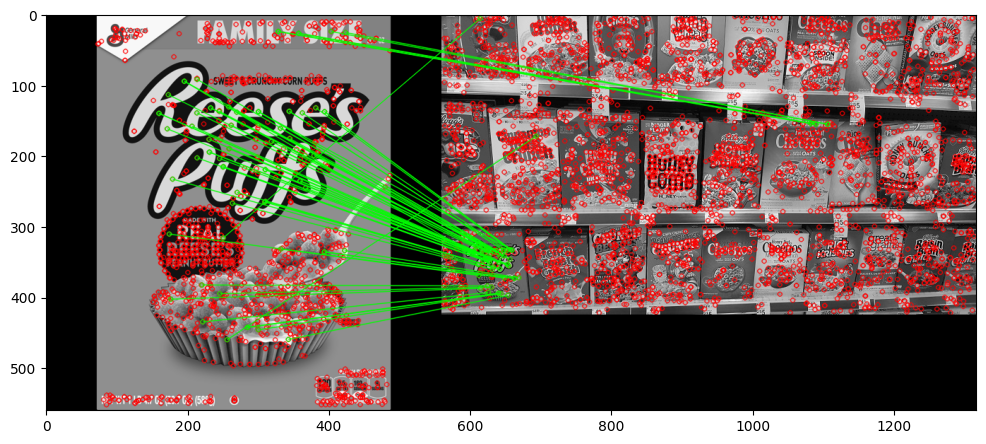

In [54]:
# Initiate SIFT detector
sift = cv2.SIFT_create()

# find the keypoints and descriptors with SIFT
kp1, des1 = sift.detectAndCompute(reeses,None)
kp2, des2 = sift.detectAndCompute(cereals,None)

# FLANN parameters
FLANN_INDEX_KDTREE = 0
index_params = dict(algorithm = FLANN_INDEX_KDTREE, trees = 5)
search_params = dict(checks=50)  

flann = cv2.FlannBasedMatcher(index_params,search_params)

matches = flann.knnMatch(des1,des2,k=2)

# Need to draw only good matches, so create a mask
matchesMask = [[0,0] for i in range(len(matches))]

# ratio test
for i,(match1,match2) in enumerate(matches):
    if match1.distance < 0.7*match2.distance:
        matchesMask[i]=[1,0]

draw_params = dict(matchColor = (0,255,0),
                   singlePointColor = (255,0,0),
                   matchesMask = matchesMask,
                   flags = 0)

flann_matches = cv2.drawMatchesKnn(reeses,kp1,cereals,kp2,matches,None,**draw_params)
display(flann_matches)

# Image Segementation and the Watershed Algorithm

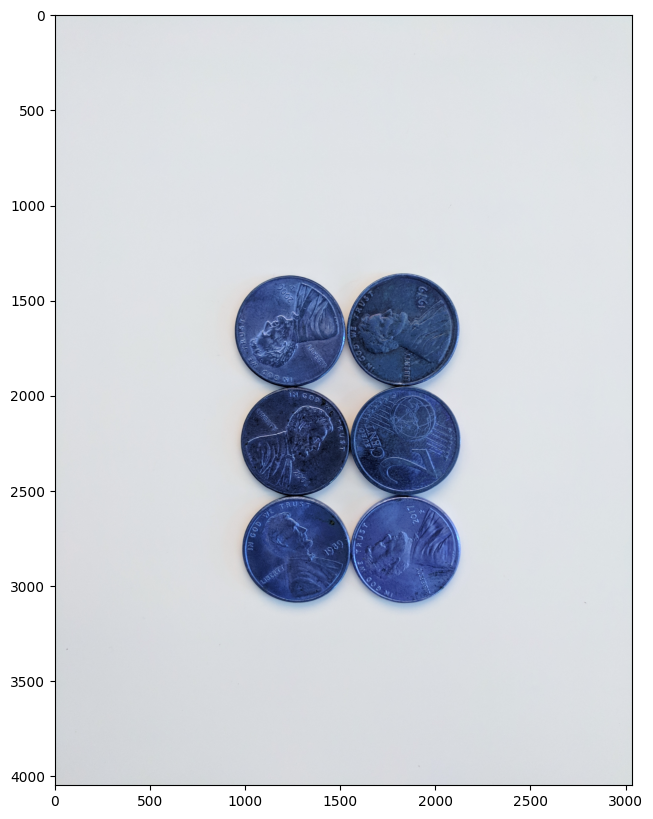

In [55]:
sep_coins = cv2.imread('DATA/pennies.jpg')
display(sep_coins)

### Apply Median Blurring

We have too much detail in this image, including light, the face edges on the coins, and too much detail in the background. Let's use Median Blur Filtering to blur the image a bit, which will be useful later on when we threshold.

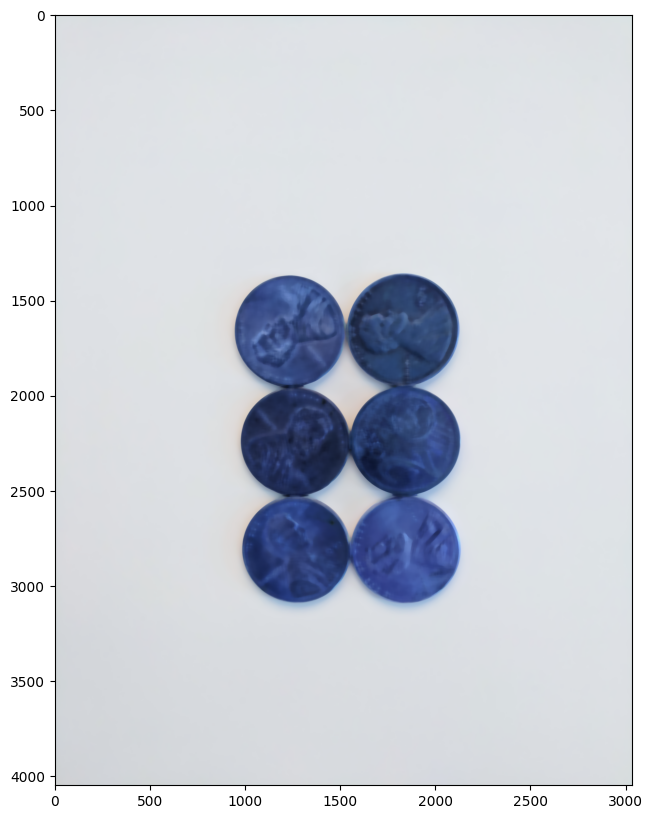

In [56]:
sep_blur = cv2.medianBlur(sep_coins,25)
display(sep_blur)

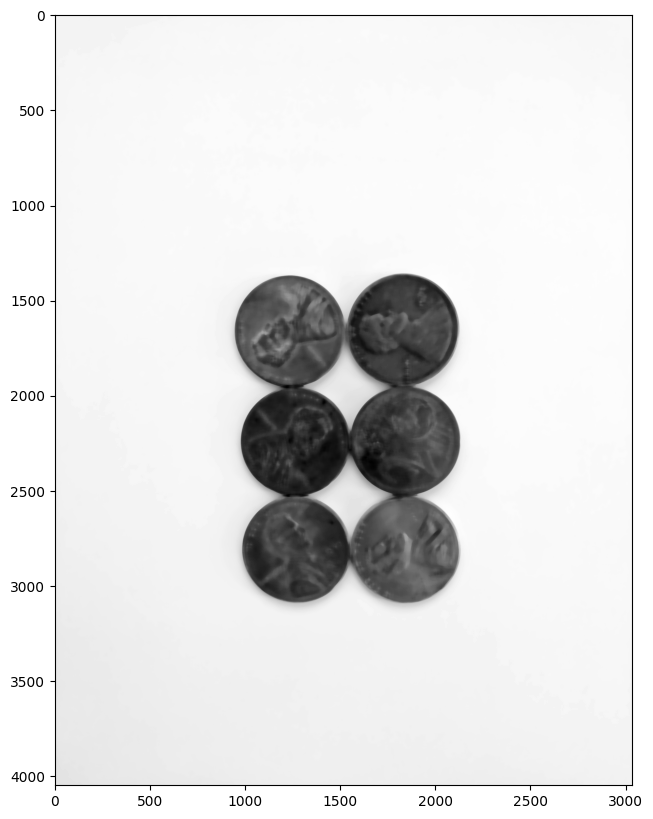

In [57]:
gray_sep_coins = cv2.cvtColor(sep_blur,cv2.COLOR_BGR2GRAY)
display(gray_sep_coins,cmap='gray')


### Binary Threshold

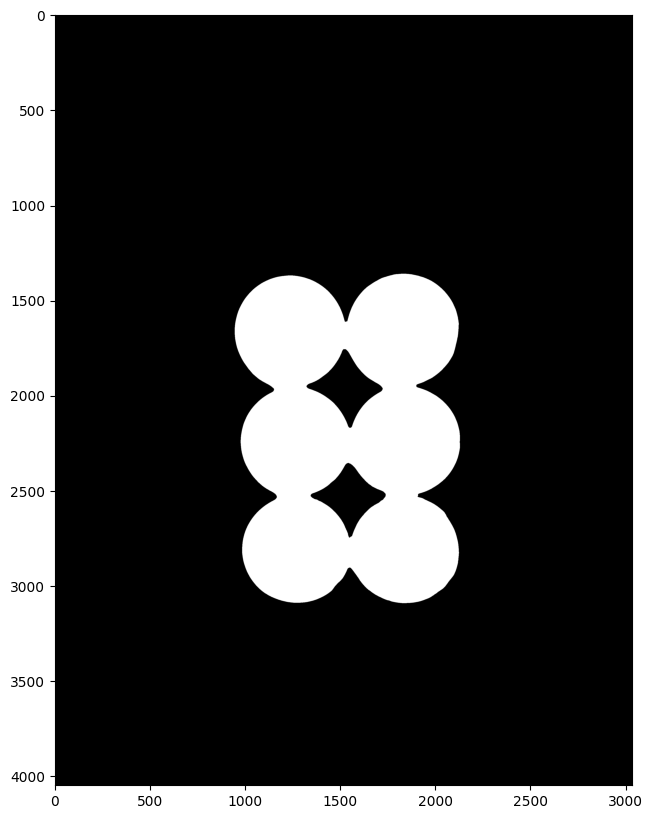

In [58]:
ret, sep_thresh = cv2.threshold(gray_sep_coins,160,255,cv2.THRESH_BINARY_INV)
display(sep_thresh,cmap='gray')

### FindContours

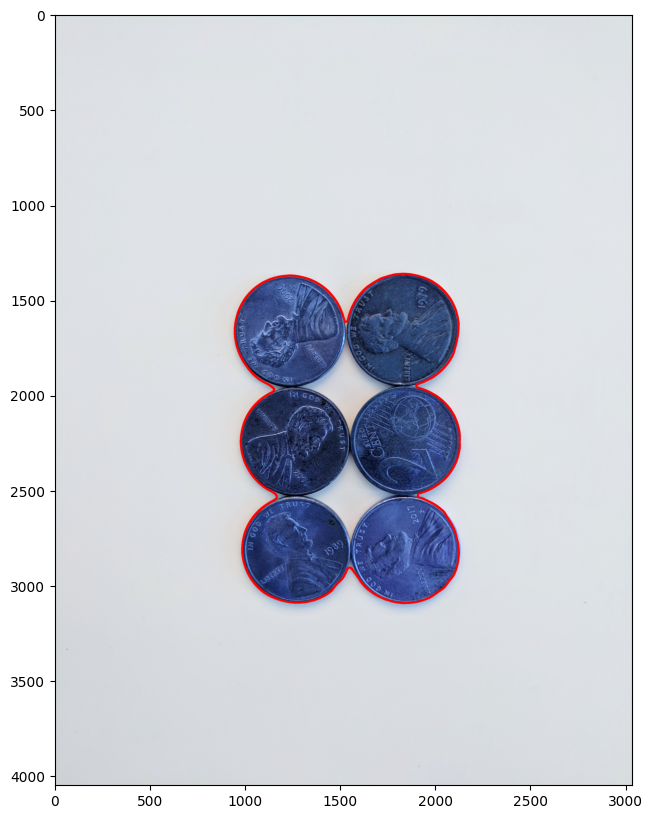

In [59]:
contours, hierarchy = cv2.findContours(sep_thresh.copy(), cv2.RETR_CCOMP, cv2.CHAIN_APPROX_SIMPLE)

# For every entry in contours
for i in range(len(contours)):
    
    # last column in the array is -1 if an external contour (no contours inside of it)
    if hierarchy[0][i][3] == -1:
        
        # We can now draw the external contours from the list of contours
        cv2.drawContours(sep_coins, contours, i, (255, 0, 0), 10)

display(sep_coins)

# Watershed Algorithm
-----------
Let's now try the watershed algorithm apporach to draw contours around the pennies. Also make sure to watch the video to understand what the function calls are doing here.
## Using the WaterShed Algorithm

#### Step 1: Read Image

In [60]:
img = cv2.imread('DATA/pennies.jpg')

#### Step 2: Apply Blur

In [61]:
img = cv2.medianBlur(img,35)

#### Step 3: Convert to Grayscale

In [62]:
gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

#### Step 4: Apply Threshold (Inverse Binary with OTSU as well)

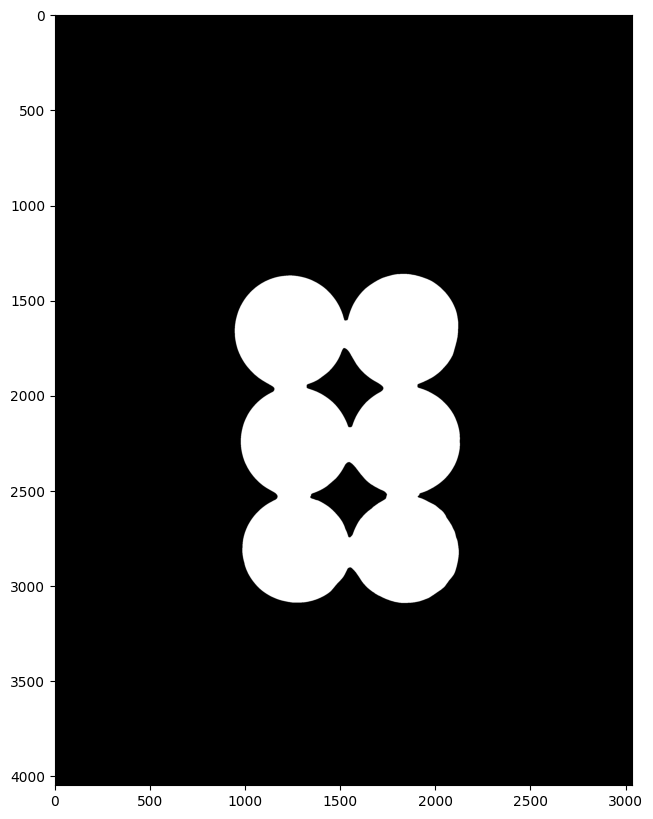

In [63]:
ret, thresh = cv2.threshold(gray,0,255,cv2.THRESH_BINARY_INV+cv2.THRESH_OTSU)
display(thresh,cmap='gray')

### Optional Step 5: Noise Removal

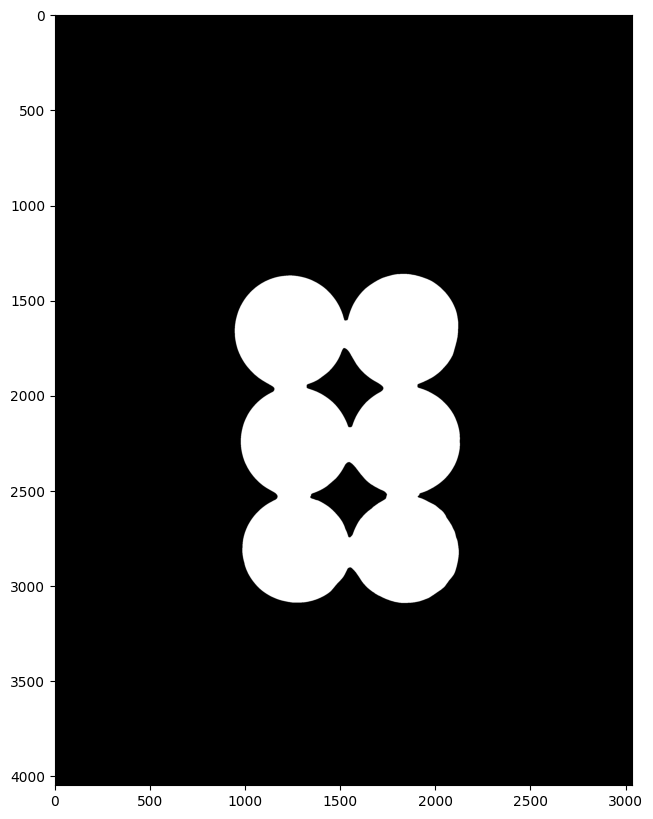

In [64]:
# noise removal
kernel = np.ones((3,3),np.uint8)
opening = cv2.morphologyEx(thresh,cv2.MORPH_OPEN,kernel, iterations = 2)
display(opening,cmap='gray')

#### Step 6: Grab Background that you are sure of

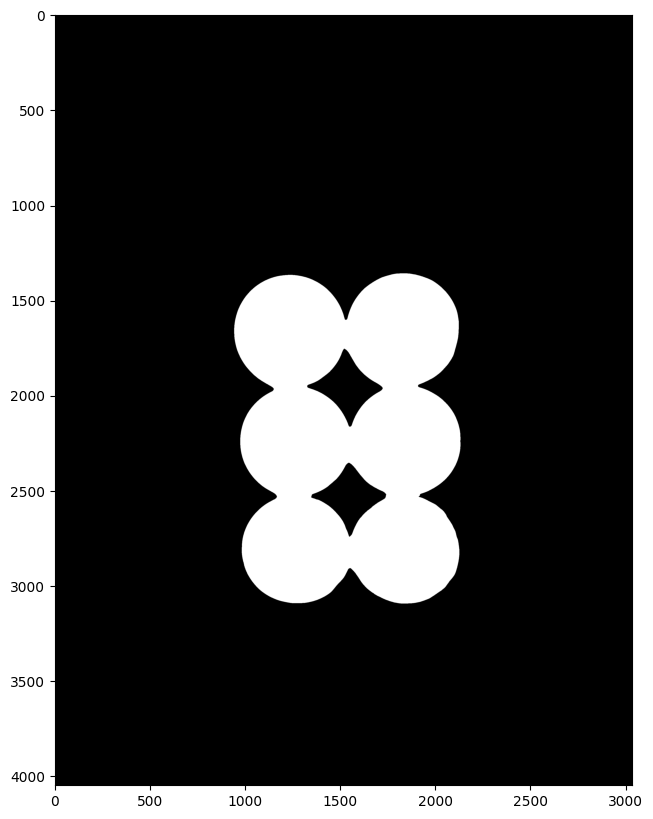

In [65]:
# sure background area
sure_bg = cv2.dilate(opening,kernel,iterations=3)
display(sure_bg,cmap='gray')

#### Step 7: Find Sure Foreground

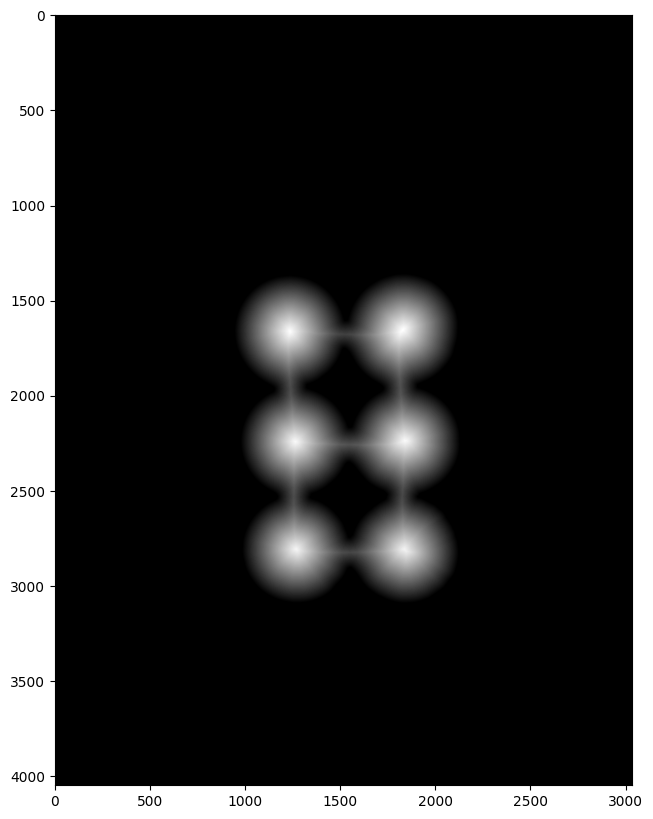

In [66]:
# Finding sure foreground area
dist_transform = cv2.distanceTransform(opening,cv2.DIST_L2,5)
ret, sure_fg = cv2.threshold(dist_transform,0.7*dist_transform.max(),255,0)
display(dist_transform,cmap='gray')

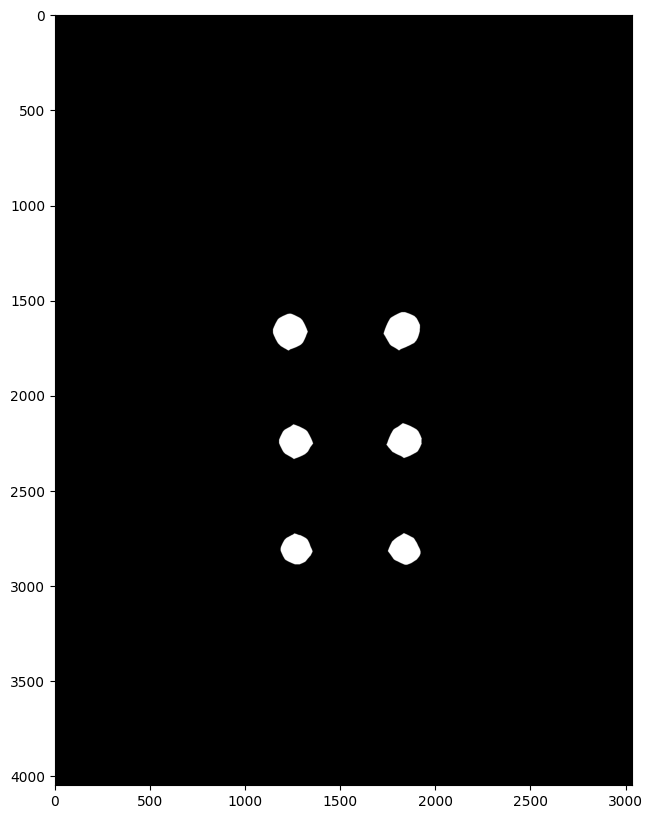

In [67]:
display(sure_fg,cmap='gray')

#### Step 8: Find Unknown Region

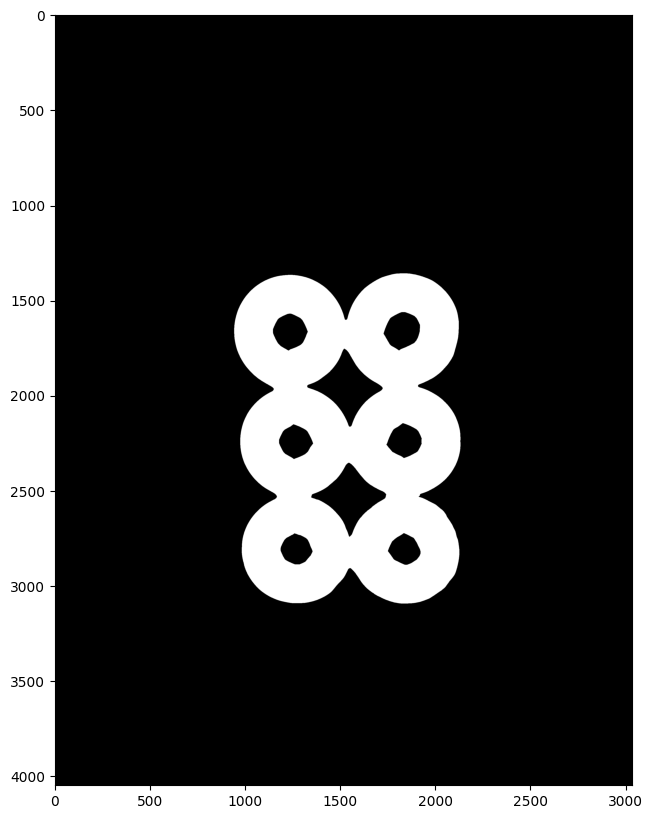

In [68]:
# Finding unknown region
sure_fg = np.uint8(sure_fg)
unknown = cv2.subtract(sure_bg,sure_fg)
display(unknown,cmap='gray')

#### Step 9: Label Markers of Sure Foreground

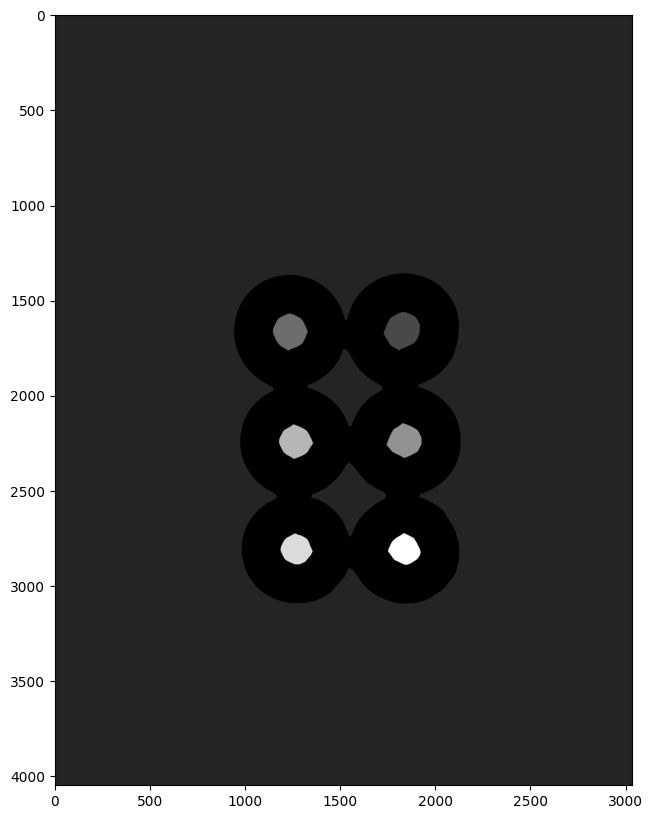

In [69]:
# Marker labelling
ret, markers = cv2.connectedComponents(sure_fg)
# Add one to all labels so that sure background is not 0, but 1
markers = markers+1
# Now, mark the region of unknown with zero
markers[unknown==255] = 0

display(markers,cmap='gray')

#### Step 10: Apply Watershed Algorithm to find Markers

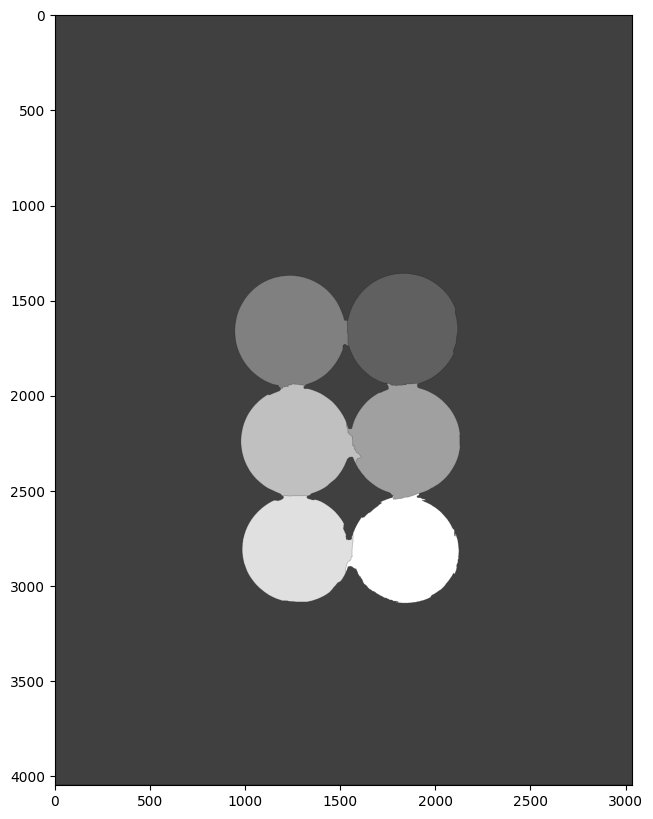

In [70]:
markers = cv2.watershed(img,markers)
display(markers)

#### Step 11: Find Contours on Markers

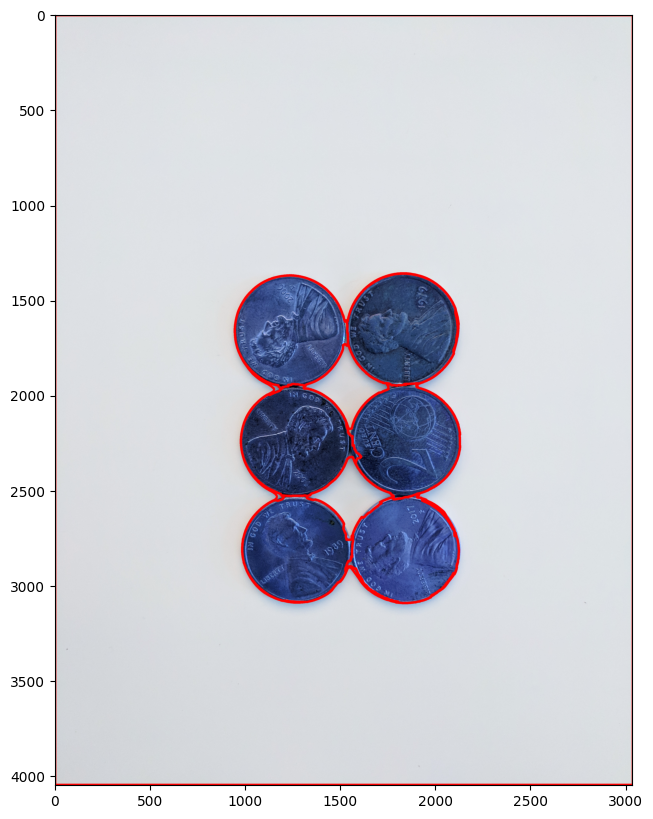

In [71]:
contours, hierarchy = cv2.findContours(markers.copy(), cv2.RETR_CCOMP, cv2.CHAIN_APPROX_SIMPLE)

# For every entry in contours
for i in range(len(contours)):
    
    # last column in the array is -1 if an external contour (no contours inside of it)
    if hierarchy[0][i][3] == -1:
        
        # We can now draw the external contours from the list of contours
        cv2.drawContours(sep_coins, contours, i, (255, 0, 0), 10)

display(sep_coins)

# Custom Seeds with the WaterShed Algorithm

Previously we did a lot of work for OpenCV to set Markers to provide seeds to the Watershed Algorithm. But what if we just provide seeds ourselves? Let's try it out!

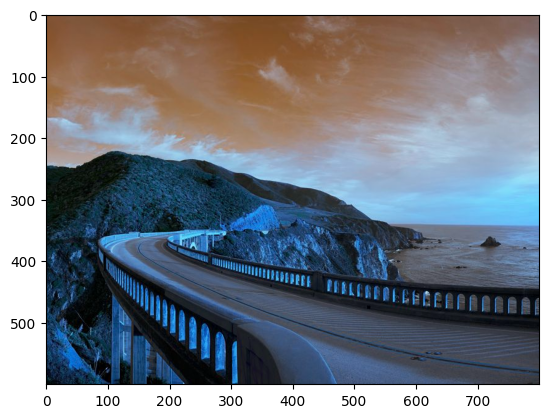

In [72]:
road = cv2.imread('DATA/road_image.jpg')
road_copy = np.copy(road)
plt.imshow(road)

#### Create an empty space for the results to be drawn

In [73]:
road.shape

(600, 800, 3)

In [74]:
marker_image = np.zeros(road.shape[:2],dtype=np.int32)

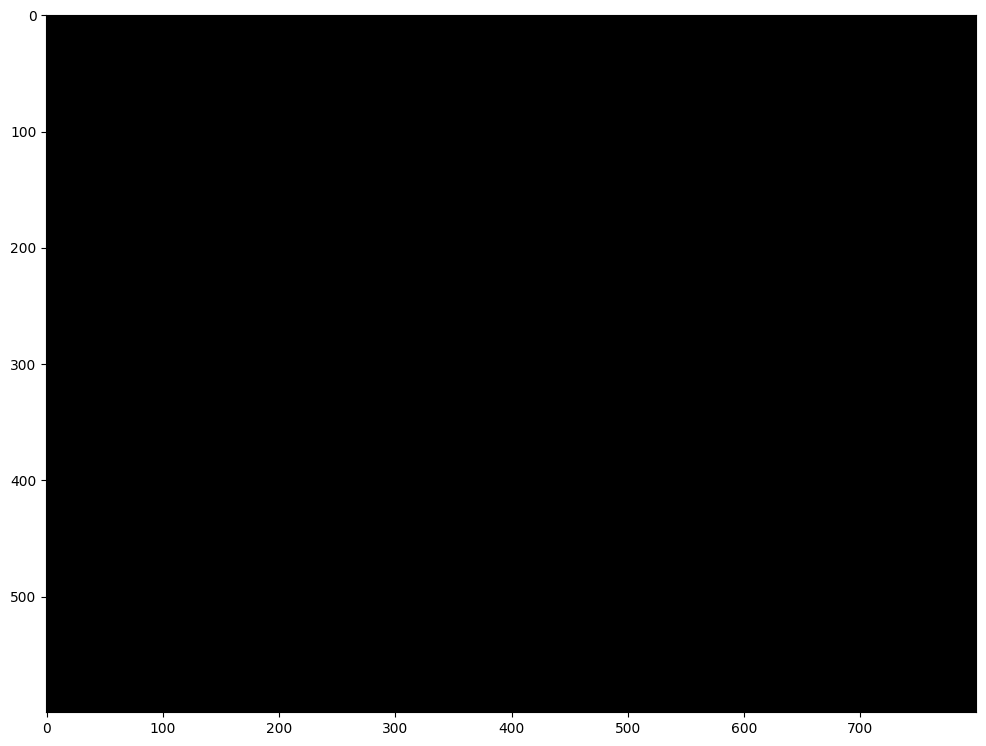

In [75]:
display(marker_image)

In [76]:
segments = np.zeros(road.shape,dtype=np.uint8)
segments.shape

(600, 800, 3)

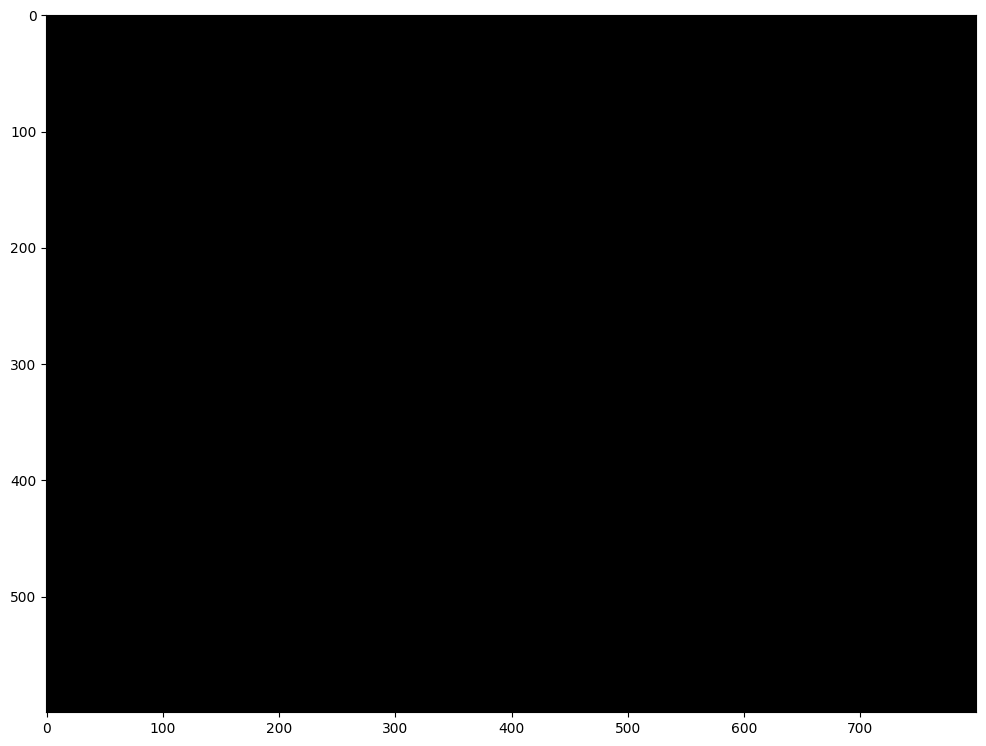

In [77]:
display(segments)

### Create colors for Markers

https://matplotlib.org/examples/color/colormaps_reference.html

In [78]:
from matplotlib import cm

Returns (R,G,B,Alpha) we only need RGB values

In [79]:
cm.tab10(0)

(0.12156862745098039, 0.4666666666666667, 0.7058823529411765, 1.0)

In [80]:
cm.tab10(1)

(1.0, 0.4980392156862745, 0.054901960784313725, 1.0)

In [81]:
np.array(cm.tab10(0))

array([0.12156863, 0.46666667, 0.70588235, 1.        ])

In [82]:
np.array(cm.tab10(0))[:3]

array([0.12156863, 0.46666667, 0.70588235])

In [83]:
np.array(cm.tab10(0))[:3]*255

array([ 31., 119., 180.])

In [84]:
x = np.array(cm.tab10(0))[:3]*255

In [85]:
x.astype(int)

array([ 31, 119, 180])

In [86]:
tuple(x.astype(int))

(31, 119, 180)

In [87]:
def create_rgb(i):
    x = np.array(cm.tab10(i))[:3]*255
    return tuple(x)

In [88]:
colors = []

In [89]:
# One color for each single digit
for i in range(10):
    colors.append(create_rgb(i))
colors

[(31.0, 119.0, 180.0),
 (255.0, 127.0, 14.0),
 (44.0, 160.0, 44.0),
 (214.0, 39.0, 40.0),
 (148.0, 103.0, 189.0),
 (140.0, 86.0, 75.0),
 (227.0, 119.0, 194.0),
 (127.0, 127.0, 127.0),
 (188.0, 189.0, 34.0),
 (23.0, 190.0, 207.0)]

### Setting Up Callback Function

In [90]:
colors

[(31.0, 119.0, 180.0),
 (255.0, 127.0, 14.0),
 (44.0, 160.0, 44.0),
 (214.0, 39.0, 40.0),
 (148.0, 103.0, 189.0),
 (140.0, 86.0, 75.0),
 (227.0, 119.0, 194.0),
 (127.0, 127.0, 127.0),
 (188.0, 189.0, 34.0),
 (23.0, 190.0, 207.0)]

In [91]:
# Numbers 0-9
n_markers = 10
# Default settings
current_marker = 1
marks_updated = False

In [92]:
def mouse_callback(event, x, y, flags, param):
    global marks_updated 

    if event == cv2.EVENT_LBUTTONDOWN:
        
        # TRACKING FOR MARKERS
        cv2.circle(marker_image, (x, y), 10, (current_marker), -1)
        
        # DISPLAY ON USER IMAGE
        cv2.circle(road_copy, (x, y), 10, colors[current_marker], -1)
        marks_updated = True


In [93]:
cv2.namedWindow('Road Image')
cv2.setMouseCallback('Road Image', mouse_callback)

while True:
    
    # SHow the 2 windows
    cv2.imshow('WaterShed Segments', segments)
    cv2.imshow('Road Image', road_copy)
        
        
    # Close everything if Esc is pressed
    k = cv2.waitKey(1)

    if k == 27:
        break
        
    # Clear all colors and start over if 'c' is pressed
    elif k == ord('c'):
        road_copy = road.copy()
        marker_image = np.zeros(road.shape[0:2], dtype=np.int32)
        segments = np.zeros(road.shape,dtype=np.uint8)
        
    # If a number 0-9 is chosen index the color
    elif k > 0 and chr(k).isdigit():
        # chr converts to printable digit
        
        current_marker  = int(chr(k))
        
        # CODE TO CHECK INCASE USER IS CARELESS
#         n = int(chr(k))
#         if 1 <= n <= n_markers:
#             current_marker = n
    
    # If we clicked somewhere, call the watershed algorithm on our chosen markers
    if marks_updated:
        
        marker_image_copy = marker_image.copy()
        cv2.watershed(road, marker_image_copy)
        
        segments = np.zeros(road.shape,dtype=np.uint8)
        
        for color_ind in range(n_markers):
            segments[marker_image_copy == (color_ind)] = colors[color_ind]
        
        marks_updated = False
        
cv2.destroyAllWindows()

# Face Detection with Haar Cascades

**Note: This is face *detection* NOT face *recognition*. We are only detecting if a face is in an image, not who the face actually is. That requires deep learning which we'll go over later!**

In [94]:
nadia = cv2.imread('DATA/Nadia_Murad.jpg',0)
denis = cv2.imread('DATA/Denis_Mukwege.jpg',0)
solvay = cv2.imread('DATA/solvay_conference.jpg',0)

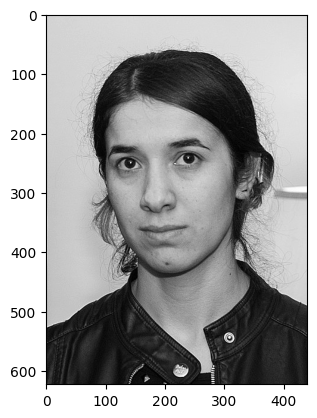

In [95]:
plt.imshow(nadia,cmap='gray')

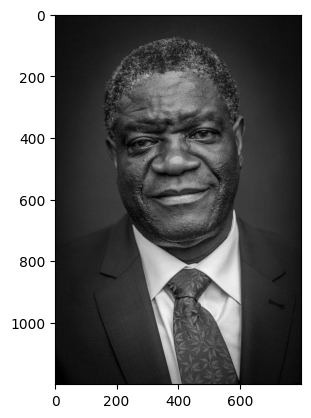

In [96]:
plt.imshow(denis,cmap='gray')

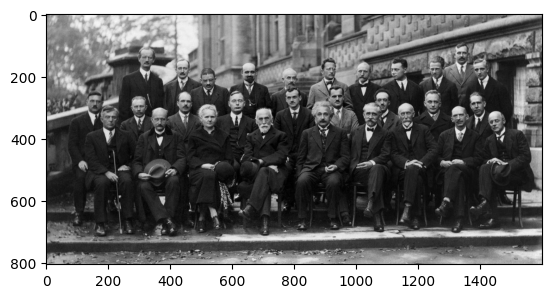

In [97]:
plt.imshow(solvay,cmap='gray')

## Cascade Files

OpenCV comes with these pre-trained cascade files, we've relocated the .xml files for you in our own DATA folder.

## Face Detection

In [98]:
face_cascade = cv2.CascadeClassifier('DATA/haarcascades/haarcascade_frontalface_default.xml')

In [99]:
def detect_face(img):
    
  
    face_img = img.copy()
  
    face_rects = face_cascade.detectMultiScale(face_img) 
    
    for (x,y,w,h) in face_rects: 
        cv2.rectangle(face_img, (x,y), (x+w,y+h), (255,255,255), 10) 
        
    return face_img

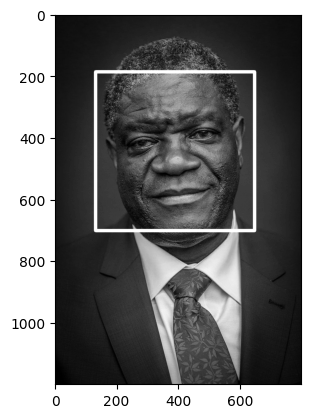

In [100]:
result = detect_face(denis)
plt.imshow(result,cmap='gray')

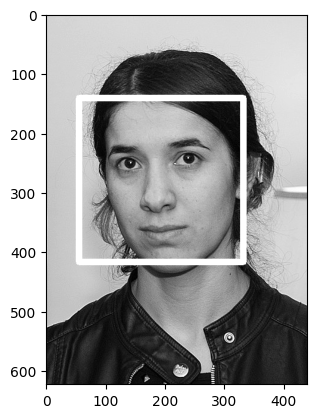

In [101]:
result = detect_face(nadia)
plt.imshow(result,cmap='gray')

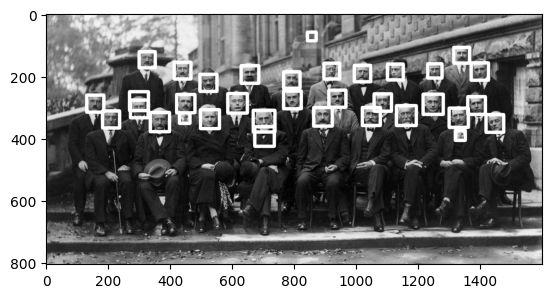

In [102]:
# Gets errors!
result = detect_face(solvay)
plt.imshow(result,cmap='gray')

In [103]:
def adj_detect_face(img):
    
    face_img = img.copy()
  
    face_rects = face_cascade.detectMultiScale(face_img,scaleFactor=1.2, minNeighbors=5) 
    
    for (x,y,w,h) in face_rects: 
        cv2.rectangle(face_img, (x,y), (x+w,y+h), (255,255,255), 10) 
        
    return face_img
    

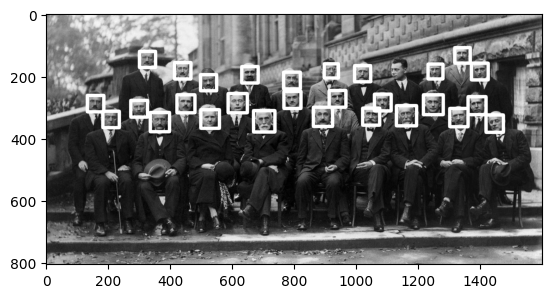

In [104]:
# Doesn't detect the side face.
result = adj_detect_face(solvay)
plt.imshow(result,cmap='gray')

In [105]:
eye_cascade = cv2.CascadeClassifier('DATA/haarcascades/haarcascade_eye.xml')

In [106]:
def detect_eyes(img):
    
    face_img = img.copy()
  
    eyes = eye_cascade.detectMultiScale(face_img) 
    
    
    for (x,y,w,h) in eyes: 
        cv2.rectangle(face_img, (x,y), (x+w,y+h), (255,255,255), 10) 
        
    return face_img

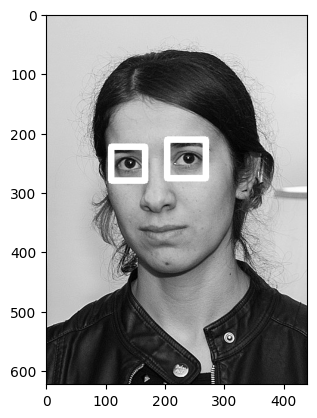

In [107]:
result = detect_eyes(nadia)
plt.imshow(result,cmap='gray')

In [108]:
eyes = eye_cascade.detectMultiScale(denis) 

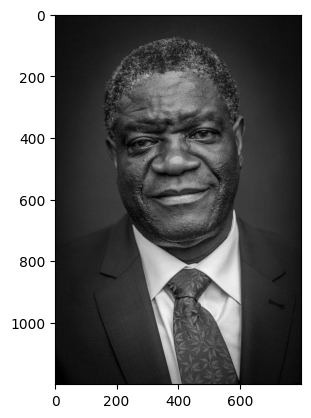

In [109]:
# White around the pupils is not distinct enough to detect Denis' eyes here!
result = detect_eyes(denis)
plt.imshow(result,cmap='gray')

Take a look at the other cascade files, you'll be using them in your upcoming project exercise!

## Conjunction with Video

In [110]:
cap = cv2.VideoCapture(0) 

while True: 
    
    ret, frame = cap.read(0) 
     
    frame = detect_face(frame)
 
    cv2.imshow('Video Face Detection', frame) 
 
    c = cv2.waitKey(1) 
    if c == 27: 
        break 
        
cap.release() 
cv2.destroyAllWindows()